In [118]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AffinityPropagation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import plotly as py
import plotly.graph_objs as go
import os
py.offline.init_notebook_mode(connected=True)
import datetime as dt


In [139]:

# Utilisez des barres obliques inversées pour échapper aux caractères d'espacement dans le chemin
DF = pd.read_csv('C:\\Users\\mbond\\Downloads\\netflix_titles VS TV show\\netflix_titles.csv')
DF.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [120]:
# Sélectionner uniquement les colonnes nécessaires
selected_columns = ['show_id', 'type', 'date_added', 'release_year', 'rating']

# Vérifier si la colonne 'country' existe dans le DataFrame avant de l'inclure
if 'country' in DF.columns:
    selected_columns.append('country')

# Sélectionner les colonnes et supprimer les lignes avec des valeurs manquantes dans les colonnes sélectionnées
DF = DF[selected_columns].dropna(subset=['show_id', 'type', 'date_added', 'release_year', 'rating'])

# Convertir la colonne 'date_added' en format de date
DF['date_added'] = pd.to_datetime(DF['date_added'])

# Afficher les premières lignes du DataFrame nettoyé
print(DF.head())


  show_id     type date_added  release_year rating        country
0      s1    Movie 2021-09-25          2020  PG-13  United States
1      s2  TV Show 2021-09-24          2021  TV-MA   South Africa
2      s3  TV Show 2021-09-24          2021  TV-MA            NaN
3      s4  TV Show 2021-09-24          2021  TV-MA            NaN
4      s5  TV Show 2021-09-24          2021  TV-MA          India


In [121]:
DF.isnull().sum()

show_id           0
type              0
date_added        0
release_year      0
rating            0
country         829
dtype: int64

In [122]:
# Supprimer les espaces blancs inutiles dans les entrées de la colonne 'country'
DF['country'] = DF['country'].str.strip()

# Diviser la colonne 'country' en une liste de pays (séparés par des virgules)
DF['country'] = DF['country'].str.split(',')

# Utiliser la méthode explode pour créer une ligne pour chaque pays
DF = DF.explode('country', ignore_index=True)

# Afficher les premières lignes du DataFrame résultant
print(DF.head())

  show_id     type date_added  release_year rating        country
0      s1    Movie 2021-09-25          2020  PG-13  United States
1      s2  TV Show 2021-09-24          2021  TV-MA   South Africa
2      s3  TV Show 2021-09-24          2021  TV-MA            NaN
3      s4  TV Show 2021-09-24          2021  TV-MA            NaN
4      s5  TV Show 2021-09-24          2021  TV-MA          India


In [123]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10836 entries, 0 to 10835
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       10836 non-null  object        
 1   type          10836 non-null  object        
 2   date_added    10836 non-null  datetime64[ns]
 3   release_year  10836 non-null  int64         
 4   rating        10836 non-null  object        
 5   country       10007 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 508.1+ KB


In [124]:
DF.shape

(10836, 6)

In [125]:
DF.head(30)

,show_id,type,date_added,release_year,rating,country
0,s1,Movie,2021-09-25,2020,PG-13,United States
1,s2,TV Show,2021-09-24,2021,TV-MA,South Africa
2,s3,TV Show,2021-09-24,2021,TV-MA,NaN
3,s4,TV Show,2021-09-24,2021,TV-MA,NaN
4,s5,TV Show,2021-09-24,2021,TV-MA,India
5,s6,TV Show,2021-09-24,2021,TV-MA,NaN
6,s7,Movie,2021-09-24,2021,PG,NaN
7,s8,Movie,2021-09-24,1993,TV-MA,United States
8,s8,Movie,2021-09-24,1993,TV-MA,Ghana
9,s8,Movie,2021-09-24,1993,TV-MA,Burkina Faso


In [126]:
# Créer un DataFrame pour compter le nombre de movies et de tv shows par pays
count_df = DF.groupby(['country', 'type']).size().unstack(fill_value=0)

# Renommer les colonnes pour plus de clarté
count_df.columns = ['Movies', 'TV Shows']

# Afficher le DataFrame résultant
print(count_df)

              Movies  TV Shows
country                       
                   6         1
 Afghanistan       1         0
 Albania           1         0
 Algeria           3         0
 Angola            1         0
...              ...       ...
Uruguay            8         1
Venezuela          2         0
Vietnam            7         0
West Germany       1         0
Zimbabwe           1         0

[197 rows x 2 columns]


In [127]:
total_movies = (DF['type'] == 'Movie').sum()
total_tv_shows = (DF['type'] == 'TV Show').sum()

# Afficher les résultats
print("Nombre total de Movies :", total_movies)
print("Nombre total de TV Shows :", total_tv_shows)

Nombre total de Movies : 7817
Nombre total de TV Shows : 3019


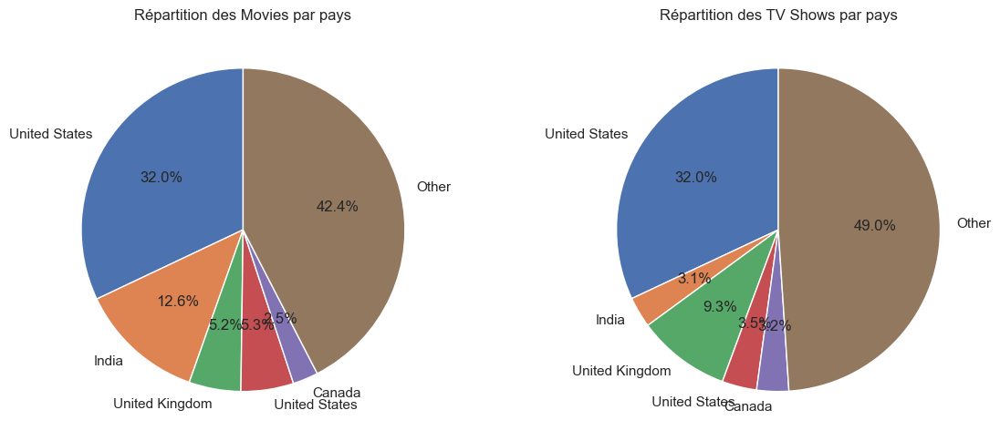

In [129]:

# Créer un DataFrame avec le nombre de movies et tv shows par pays
count_df = DF.groupby(['country', 'type']).size().unstack(fill_value=0)

# Calculer le total de movies et tv shows par pays
count_df['Total'] = count_df['Movie'] + count_df['TV Show']

# Trier le DataFrame par le total décroissant et prendre les 5 premiers pays
top_5_countries = count_df.sort_values(by='Total', ascending=False).head(5)

# Regrouper les autres pays dans une seule ligne
other_countries = pd.DataFrame({
    'Movie': [count_df['Movie'].sum() - top_5_countries['Movie'].sum()],
    'TV Show': [count_df['TV Show'].sum() - top_5_countries['TV Show'].sum()]
}, index=['Other'])

# Concaténer les 5 premiers pays et les "Other" en un seul DataFrame
combined_df = pd.concat([top_5_countries, other_countries])

# Créer deux sous-plots pour les diagrammes circulaires
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Diagramme circulaire pour les movies
ax1.pie(combined_df['Movie'], labels=combined_df.index, autopct='%1.1f%%', startangle=90)
ax1.set_title('Répartition des Movies par pays')

# Diagramme circulaire pour les tv shows
ax2.pie(combined_df['TV Show'], labels=combined_df.index, autopct='%1.1f%%', startangle=90)
ax2.set_title('Répartition des TV Shows par pays')

# Afficher les diagrammes circulaires
plt.tight_layout()
plt.show()


In [130]:

import folium
from folium.plugins import MarkerCluster

# Regrouper les données par pays et type
grouped_data = DF[DF['type'] == 'Movie'].groupby('country').size().reset_index(name='movie_count')

# Charger le fichier GeoJSON des frontières des pays
world_geojson = 'https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson'

# Créer une carte du monde avec Folium
m = folium.Map(location=[0, 0], zoom_start=2)

# Ajouter des marqueurs pour chaque pays avec le nombre de films
marker_cluster = MarkerCluster().add_to(m)
for index, row in grouped_data.iterrows():
    country = row['country']
    movie_count = row['movie_count']
    folium.Marker(location=[0, 0], tooltip=f"{country}: {movie_count} films").add_to(marker_cluster)

# Afficher la carte
m.save('world_movie_map.html')  # Sauvegarder la carte au format HTML



In [72]:
pip install folium


Note: you may need to restart the kernel to use updated packages.


In [131]:
import folium
from folium.plugins import MarkerCluster


# Regrouper les données par pays et type (TV Show)
grouped_data_tv_shows = DF[DF['type'] == 'TV Show'].groupby('country').size().reset_index(name='tv_show_count')

# Charger le fichier GeoJSON des frontières des pays
world_geojson = 'https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson'

# Créer une carte du monde avec Folium
m = folium.Map(location=[0, 0], zoom_start=2)

# Ajouter des marqueurs pour chaque pays avec le nombre de séries télévisées (TV shows)
marker_cluster = MarkerCluster().add_to(m)
for index, row in grouped_data_tv_shows.iterrows():
    country = row['country']
    tv_show_count = row['tv_show_count']
    folium.Marker(location=[0, 0], tooltip=f"{country}: {tv_show_count} séries télévisées").add_to(marker_cluster)

# Afficher la carte
m.save('world_tv_show_map.html')  # Sauvegarder la carte au format HTML


In [132]:
pip install ipyleaflet


Note: you may need to restart the kernel to use updated packages.


In [133]:
pip install ipyleaflet


Note: you may need to restart the kernel to use updated packages.


In [134]:

!pip install ipyleaflet

In [135]:
pip show ipyleaflet


Name: ipyleafletNote: you may need to restart the kernel to use updated packages.

Version: 0.17.3
Summary: A Jupyter widget for dynamic Leaflet maps
Home-page: https://github.com/jupyter-widgets/ipyleaflet
Author: Project Jupyter
Author-email: jupyter@googlegroups.com
License: MIT License
Location: C:\Users\mbond\anaconda3\Lib\site-packages
Requires: branca, ipywidgets, traittypes, xyzservices
Required-by: 


In [136]:


# Regrouper les données par pays et type (Movie)
grouped_data = DF[DF['type'] == 'Movie'].groupby('country').size().reset_index(name='movie_count')

# Créer une carte du monde avec ipyleaflet
m = Map(basemap=basemaps.OpenStreetMap.Mapnik, center=(0, 0), zoom=2)

# Créer un cluster de marqueurs pour les pays
marker_cluster = MarkerCluster(markers=[Marker(location=(0, 0), draggable=False, icon=None, children=[HTML(value=f"{row['country']}: {row['movie_count']} films")]) for index, row in grouped_data.iterrows()])
m.add_layer(marker_cluster)

# Afficher la carte
m


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

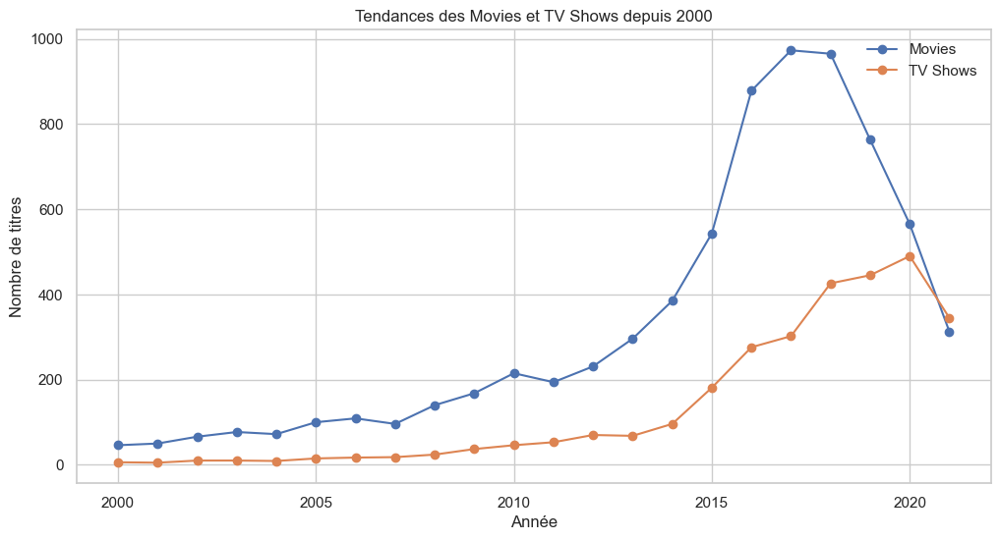

In [137]:
import pandas as pd
import matplotlib.pyplot as plt

# Filtrer les données à partir de l'année 2000
df_filtered = DF[DF['release_year'] >= 2000]

# Regrouper les données par année et type (Movie ou TV Show)
grouped_data = df_filtered.groupby(['release_year', 'type']).size().unstack(fill_value=0)

# Créer un graphique linéaire des tendances
plt.figure(figsize=(12, 6))
plt.plot(grouped_data.index, grouped_data['Movie'], label='Movies', marker='o', linestyle='-')
plt.plot(grouped_data.index, grouped_data['TV Show'], label='TV Shows', marker='o', linestyle='-')

# Personnaliser le graphique
plt.title('Tendances des Movies et TV Shows depuis 2000')
plt.xlabel('Année')
plt.ylabel('Nombre de titres')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


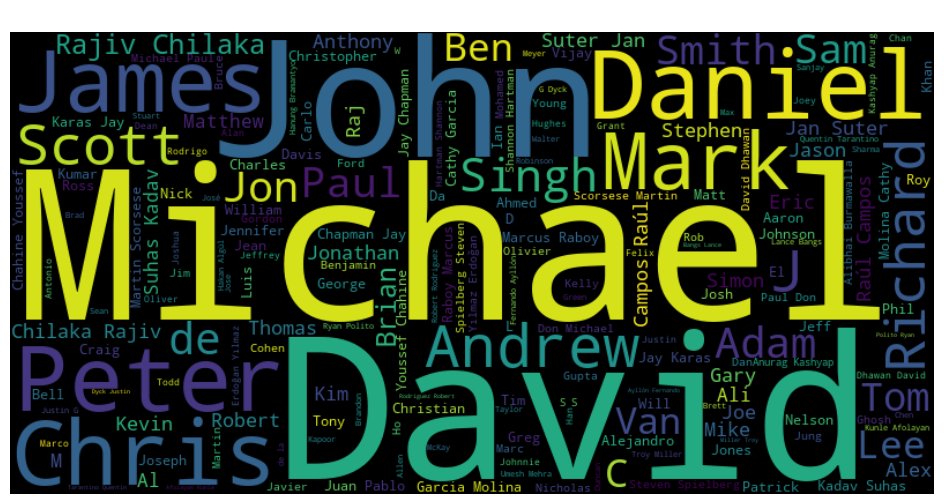

In [140]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

'''Nuage de Mots des Réalisateurs les plus Prolifiques sur Netflix'''
# Supposons que vous ayez déjà chargé votre DataFrame DF

# Créez un nouveau DataFrame pour stocker les réalisateurs et le nombre de titres qu'ils ont dirigés
directors_df = DF['director'].str.split(', ').explode().value_counts().reset_index()
directors_df.columns = ['Réalisateur', 'Nombre de Titres']

# Triez les réalisateurs par le nombre de titres dirigés (en ordre décroissant)
directors_df = directors_df.sort_values(by='Nombre de Titres', ascending=False)

# Créez une chaîne de texte contenant les réalisateurs répétés en fonction de leur nombre de titres
text = " ".join((" ".join([row['Réalisateur']] * row['Nombre de Titres'])) for _, row in directors_df.iterrows())

# Créez un nuage de mots avec WordCloud sur fond noir
wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate(text)

# Affichez le nuage de mots
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Nuage de Mots des Réalisateurs les plus Prolifiques sur Netflix', fontsize=14, color='white')
plt.show()



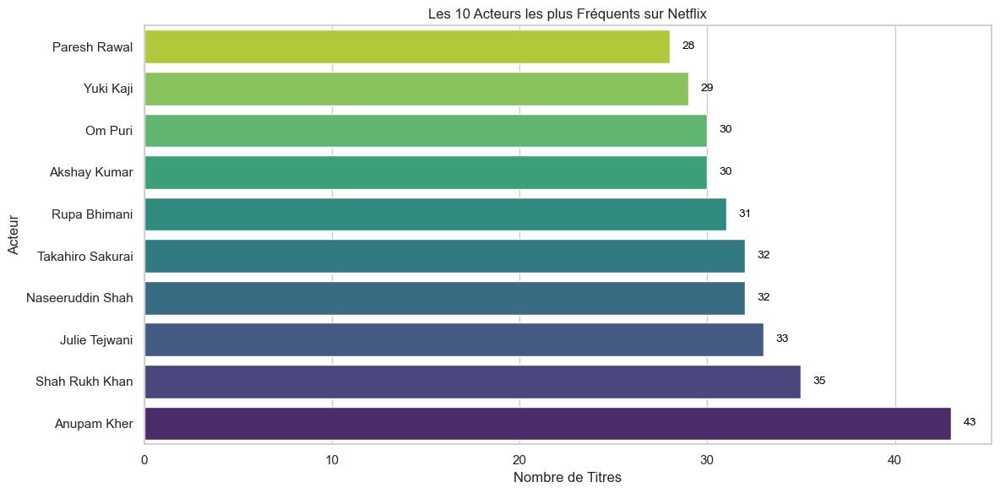

In [144]:
''' les acteurs les plus fréquemment présents dans les films et les émissions de télévision sur Netflix'''

# Créez un nouveau DataFrame pour stocker les acteurs et le nombre de titres dans lesquels ils apparaissent
actors_df = DF['cast'].str.split(', ').explode().value_counts().reset_index()
actors_df.columns = ['Acteur', 'Nombre de Titres']

# Triez les acteurs par le nombre de titres dans lesquels ils apparaissent (en ordre décroissant)
actors_df = actors_df.sort_values(by='Nombre de Titres', ascending=False)

# Sélectionnez les 10 acteurs les plus fréquents
top_10_actors = actors_df.head(10)

# Créez un graphique à barres horizontales avec Seaborn pour un style esthétique
plt.figure(figsize=(12, 6))
sns.barplot(x='Nombre de Titres', y='Acteur', data=top_10_actors, palette='viridis')
plt.xlabel('Nombre de Titres')
plt.ylabel('Acteur')
plt.title('Les 10 Acteurs les plus Fréquents sur Netflix')

# Inverser l'axe y pour afficher l'acteur le plus fréquent en haut
plt.gca().invert_yaxis()

# Ajouter des annotations de nombre de titres à côté des barres
for index, row in top_10_actors.iterrows():
    plt.text(row['Nombre de Titres'] + 1, index, row['Nombre de Titres'], ha='center', va='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()


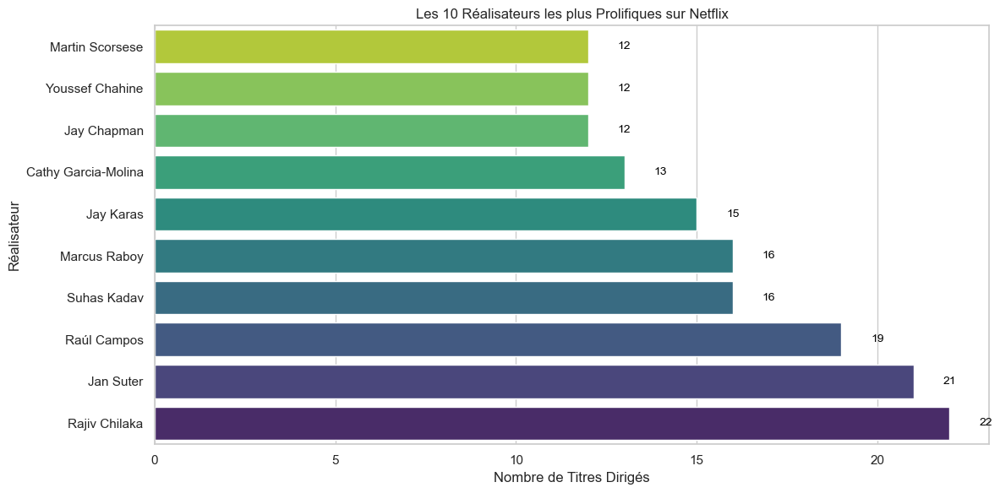

In [143]:
'''les réalisateurs les plus prolifiques qui ont dirigé le plus grand nombre de films ou d'émissions de télévision sur Netflix'''

# Créez un nouveau DataFrame pour stocker les réalisateurs et le nombre de titres qu'ils ont dirigés


directors_df = DF['director'].str.split(', ').explode().value_counts().reset_index()
directors_df.columns = ['Réalisateur', 'Nombre de Titres']

# Triez les réalisateurs par le nombre de titres dirigés (en ordre décroissant)
directors_df = directors_df.sort_values(by='Nombre de Titres', ascending=False)

# Sélectionnez les 10 réalisateurs les plus prolifiques
top_10_directors = directors_df.head(10)

# Créez un graphique à barres horizontales avec Seaborn pour un style esthétique
plt.figure(figsize=(12, 6))
sns.barplot(x='Nombre de Titres', y='Réalisateur', data=top_10_directors, palette='viridis')
plt.xlabel('Nombre de Titres Dirigés')
plt.ylabel('Réalisateur')
plt.title('Les 10 Réalisateurs les plus Prolifiques sur Netflix')

# Inverser l'axe y pour afficher le réalisateur le plus prolifique en haut
plt.gca().invert_yaxis()

# Ajouter des annotations de nombre de titres à côté des barres
for index, row in top_10_directors.iterrows():
    plt.text(row['Nombre de Titres'] + 1, index, row['Nombre de Titres'], ha='center', va='center', fontsize=10, color='black')

plt.tight_layout()
plt.show()


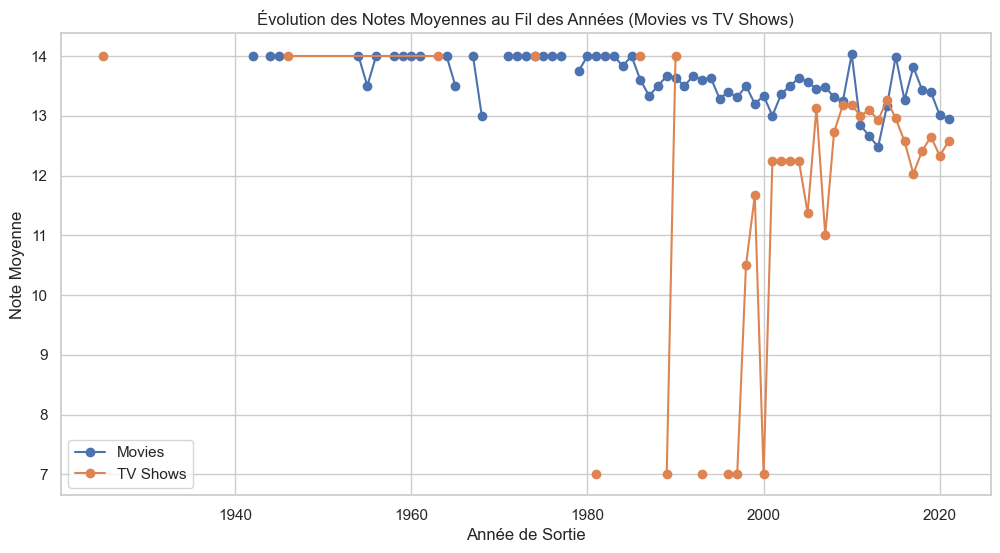

In [47]:
import pandas as pd
import matplotlib.pyplot as plt



# Nettoyer la colonne 'rating' en extrayant les valeurs numériques
def extract_numeric_rating(rating):
    try:
        # Trouver la première occurrence de chiffres dans la chaîne
        numeric_part = ''.join(filter(str.isdigit, rating))
        return float(numeric_part)
    except:
        return None

DF['rating'] = DF['rating'].apply(extract_numeric_rating)

# Filtrer les données pour inclure uniquement les films (type == 'Movie')
movies_DF = DF[DF['type'] == 'Movie']

# Groupement des données par année de sortie et calcul de la note moyenne des films par année
average_ratings_by_year_movies = movies_DF.groupby('release_year')['rating'].mean()

# Filtrer les données pour inclure uniquement les émissions de télévision (type == 'TV Show')
tv_shows_DF = DF[DF['type'] == 'TV Show']

# Groupement des données par année de sortie et calcul de la note moyenne des émissions de télévision par année
average_ratings_by_year_tv_shows = tv_shows_DF.groupby('release_year')['rating'].mean()

# Créer un graphique pour l'évolution des notes moyennes des films au fil des années
plt.figure(figsize=(12, 6))
plt.plot(average_ratings_by_year_movies.index, average_ratings_by_year_movies.values, label='Movies', marker='o', linestyle='-')

# Créer un graphique pour l'évolution des notes moyennes des émissions de télévision au fil des années
plt.plot(average_ratings_by_year_tv_shows.index, average_ratings_by_year_tv_shows.values, label='TV Shows', marker='o', linestyle='-')

# Personnaliser le graphique
plt.title('Évolution des Notes Moyennes au Fil des Années (Movies vs TV Shows)')
plt.xlabel('Année de Sortie')
plt.ylabel('Note Moyenne')
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


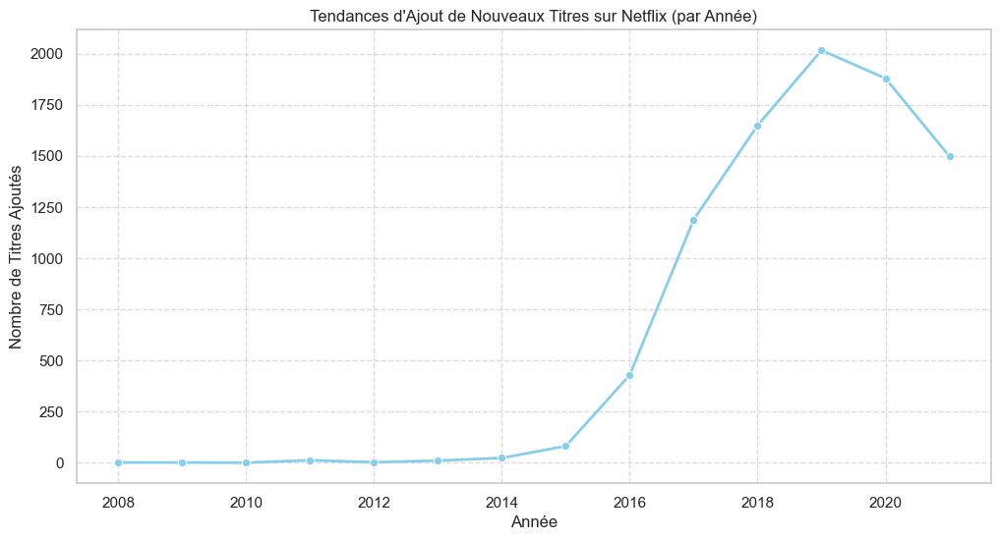

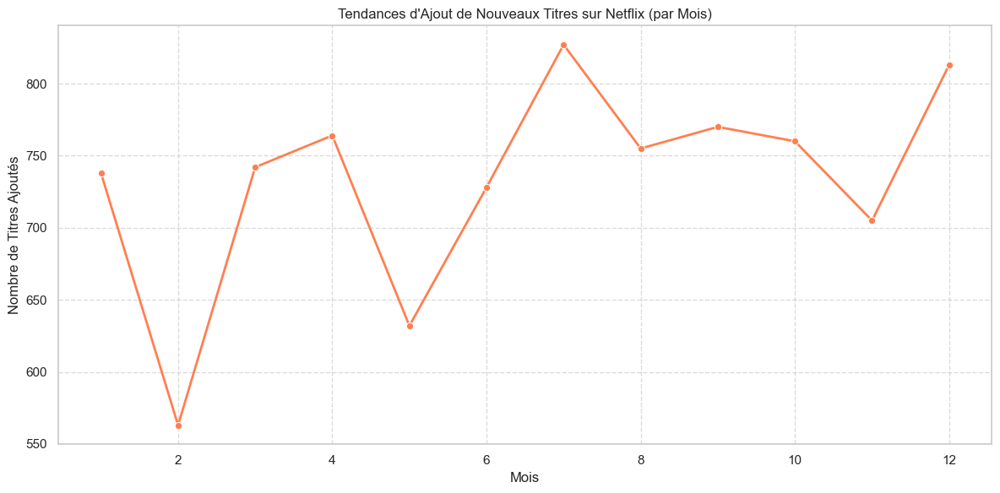

In [43]:

# Convertir la colonne 'date_added' en format datetime
DF['date_added'] = pd.to_datetime(DF['date_added'])

# Extraire l'année et le mois de la colonne 'date_added'
DF['Year'] = DF['date_added'].dt.year
DF['Month'] = DF['date_added'].dt.month

# Créer un DataFrame pour compter le nombre de titres ajoutés par année
titles_added_by_year = DF['Year'].value_counts().reset_index()
titles_added_by_year.columns = ['Année', 'Nombre de Titres']

# Créer un DataFrame pour compter le nombre de titres ajoutés par mois
titles_added_by_month = DF['Month'].value_counts().reset_index()
titles_added_by_month.columns = ['Mois', 'Nombre de Titres']

# Trier les données par année ou par mois
titles_added_by_year = titles_added_by_year.sort_values(by='Année')
titles_added_by_month = titles_added_by_month.sort_values(by='Mois')

# Créer un graphique pour afficher les tendances d'ajout par année
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")  # Style de fond
sns.lineplot(x='Année', y='Nombre de Titres', data=titles_added_by_year, marker='o', color='skyblue', linewidth=2)
plt.xlabel('Année')
plt.ylabel('Nombre de Titres Ajoutés')
plt.title('Tendances d\'Ajout de Nouveaux Titres sur Netflix (par Année)')
plt.grid(True, linestyle='--', alpha=0.7)  # Ajout de grilles en pointillés

# Créer un graphique pour afficher les tendances d'ajout par mois
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")  # Style de fond
sns.lineplot(x='Mois', y='Nombre de Titres', data=titles_added_by_month, marker='o', color='coral', linewidth=2)
plt.xlabel('Mois')
plt.ylabel('Nombre de Titres Ajoutés')
plt.title('Tendances d\'Ajout de Nouveaux Titres sur Netflix (par Mois)')
plt.grid(True, linestyle='--', alpha=0.7)  # Ajout de grilles en pointillés

plt.tight_layout()
plt.show()


In [117]:
DF.head()




,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


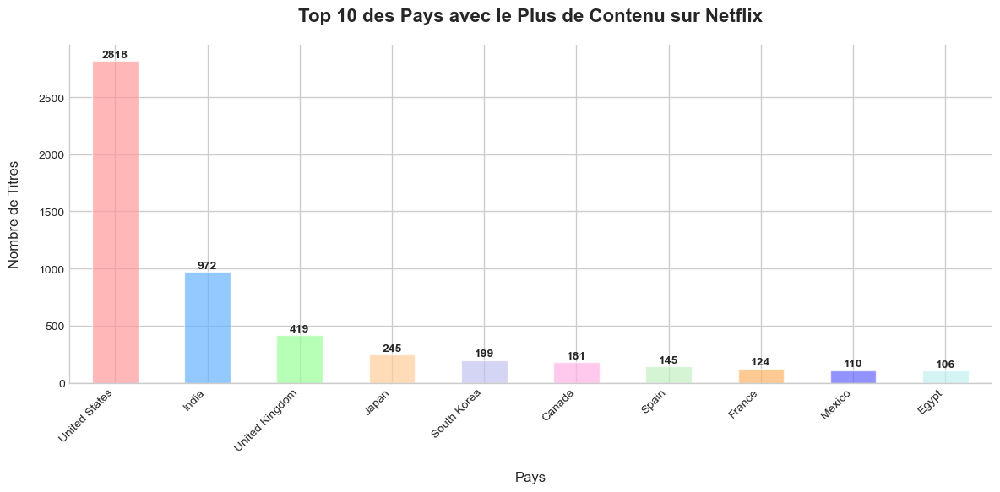

In [149]:
import matplotlib.pyplot as plt
import seaborn as sns

# Agrégez les données pour éviter les doublons
aggregated_data = DF.groupby('country')['show_id'].count().nlargest(10)

# Utilisez un style de tracé de seaborn pour une esthétique améliorée
sns.set_style("whitegrid")

# Créez une palette de couleurs personnalisée
colors = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#c2c2f0', '#ffb3e6', '#c2f0c2', '#ffb366', '#6666ff', '#c2f0f0']

# Créez le graphique à barres avec des couleurs personnalisées
plt.figure(figsize=(12, 6))
ax = aggregated_data.plot(kind="bar", color=colors, alpha=0.7)

# Personnalisez les détails du graphique
plt.title('Top 10 des Pays avec le Plus de Contenu sur Netflix', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Pays', fontsize=12, labelpad=15)
plt.ylabel('Nombre de Titres', fontsize=12, labelpad=15)
plt.yticks(fontsize=10)

# Ajoutez des étiquettes aux barres avec le nombre de titres
for i, v in enumerate(aggregated_data):
    ax.text(i, v + 10, str(v), ha='center', va='bottom', fontsize=10, fontweight='bold')

# Faites pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.xticks(rotation=45, fontsize=10, ha='right')
plt.gca().set_xticklabels(aggregated_data.index, rotation=45, ha='right', fontsize=10)

# Supprimez la bordure supérieure et la bordure droite du graphique
sns.despine()

# Affichez le graphique
plt.tight_layout()
plt.show()


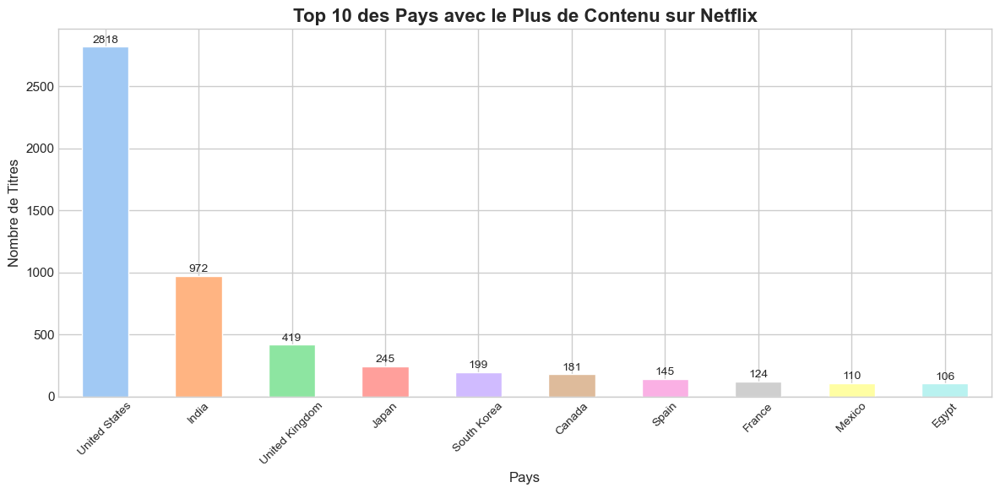

In [147]:
import matplotlib.pyplot as plt
import seaborn as sns

# Agrégez les données pour éviter les doublons
aggregated_data = DF.groupby('country')['show_id'].count().nlargest(10)

# Utilisez un style de tracé de seaborn pour une esthétique améliorée
sns.set_style("whitegrid")

# Créez le graphique à barres avec des couleurs personnalisées
colors = sns.color_palette("pastel")
plt.figure(figsize=(12, 6))
ax = aggregated_data.plot(kind="bar", color=colors)

# Personnalisez les détails du graphique
plt.title('Top 10 des Pays avec le Plus de Contenu sur Netflix', fontsize=16, fontweight='bold')
plt.xlabel('Pays', fontsize=12)
plt.ylabel('Nombre de Titres', fontsize=12)

# Ajoutez des étiquettes aux barres avec le nombre de titres
for i, v in enumerate(aggregated_data):
    ax.text(i, v + 10, str(v), ha='center', va='bottom', fontsize=10)

# Faites pivoter les étiquettes de l'axe x pour une meilleure lisibilité
plt.xticks(rotation=45, fontsize=10)

# Affichez le graphique
plt.tight_layout()
plt.show()


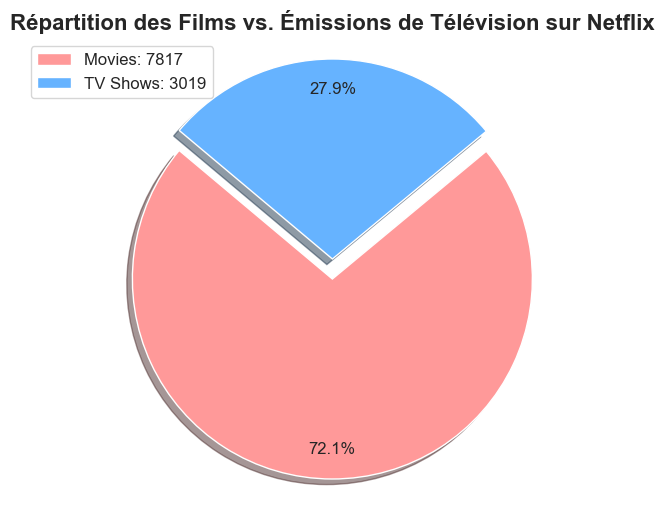

In [85]:
import matplotlib.pyplot as plt

# Comptez le nombre de films et d'émissions de télévision
count_movies = DF[DF['type'] == 'Movie']['type'].count()
count_tv_shows = DF[DF['type'] == 'TV Show']['type'].count()

# Créez les étiquettes et les valeurs pour le graphique
labels = ['Movies', 'TV Shows']
sizes = [count_movies, count_tv_shows]
colors = ['#ff9999', '#66b3ff']  # Choisissez des couleurs pour les tranches
explode = (0.1, 0)  # Pour faire ressortir légèrement la tranche "Movies"

# Créez le graphique circulaire avec des paramètres esthétiques améliorés
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=['', ''], autopct='%1.1f%%', colors=colors, startangle=140, pctdistance=0.85, explode=explode, shadow=True)
plt.title('Répartition des Films vs. Émissions de Télévision sur Netflix', fontsize=16, fontweight='bold')

# Ajustez le ratio d'aspect pour que le graphique soit un cercle
plt.axis('equal')

# Affichez le graphique avec une légende montrant le nombre de films et d'émissions de télévision
plt.legend(loc='upper left', labels=[f'{l}: {s}' for l, s in zip(labels, sizes)], fontsize=12)

# Affichez le graphique
plt.show()






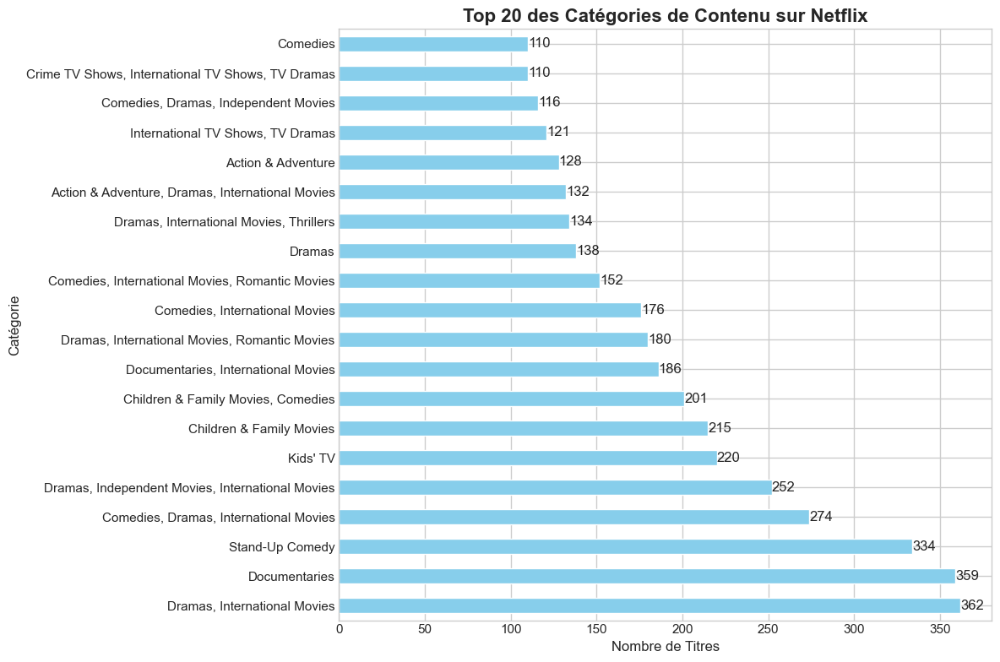

In [95]:



# Sélectionnez les 20 principales catégories de contenu
top_20_categories = DF['listed_in'].value_counts()[:20]

# Ajustez le style des graphiques
plt.style.use('seaborn-whitegrid')

# Créez le graphique à barres
plt.figure(figsize=(12, 8))
top_20_categories.plot(kind="barh", color='skyblue')
plt.title('Top 20 des Catégories de Contenu sur Netflix', fontsize=16, fontweight='bold')
plt.xlabel('Nombre de Titres')
plt.ylabel('Catégorie')

# Ajoutez des étiquettes aux barres
for index, value in enumerate(top_20_categories):
    plt.text(value, index, str(value), ha='left', va='center')

# Affichez le graphique
plt.tight_layout()
plt.show()




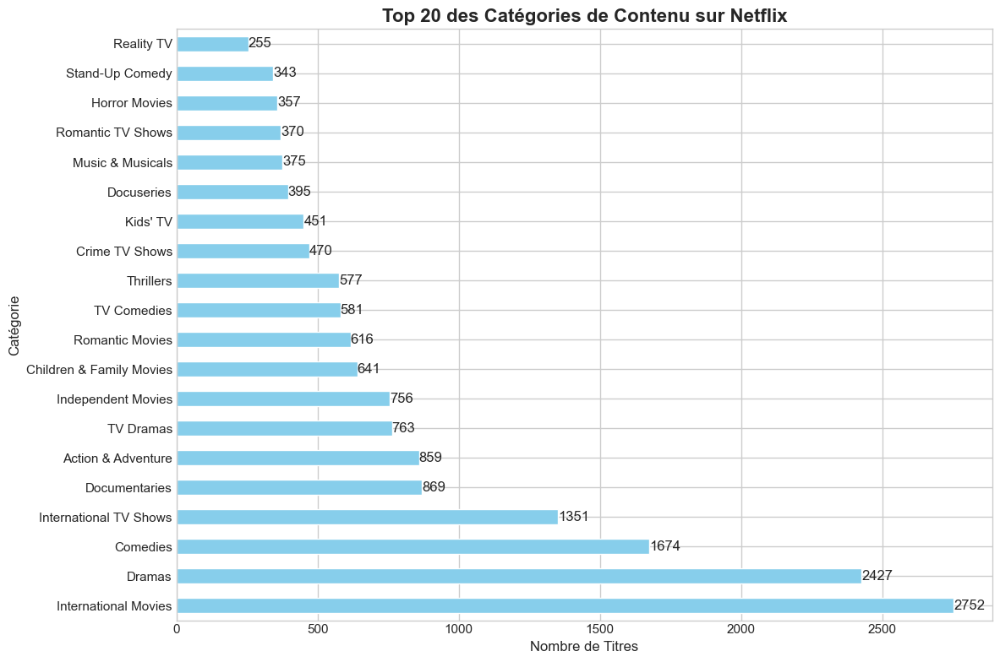

In [94]:
# Séparez les descriptions de la colonne 'listed_in' en différentes lignes
categories = DF['listed_in'].str.split(', ', expand=True).stack()

# Comptez le nombre d'occurrences de chaque description
category_counts = categories.value_counts()

# Sélectionnez les 20 principales descriptions
top_20_categories = category_counts.head(20)

# Ajustez le style des graphiques
plt.style.use('seaborn-whitegrid')

# Créez le graphique à barres
plt.figure(figsize=(12, 8))
top_20_categories.plot(kind="barh", color='skyblue')
plt.title('Top 20 des Catégories de Contenu sur Netflix', fontsize=16, fontweight='bold')
plt.xlabel('Nombre de Titres')
plt.ylabel('Catégorie')

# Ajoutez des étiquettes aux barres
for index, value in enumerate(top_20_categories):
    plt.text(value, index, str(value), ha='left', va='center')

# Affichez le graphique
plt.tight_layout()
plt.show()


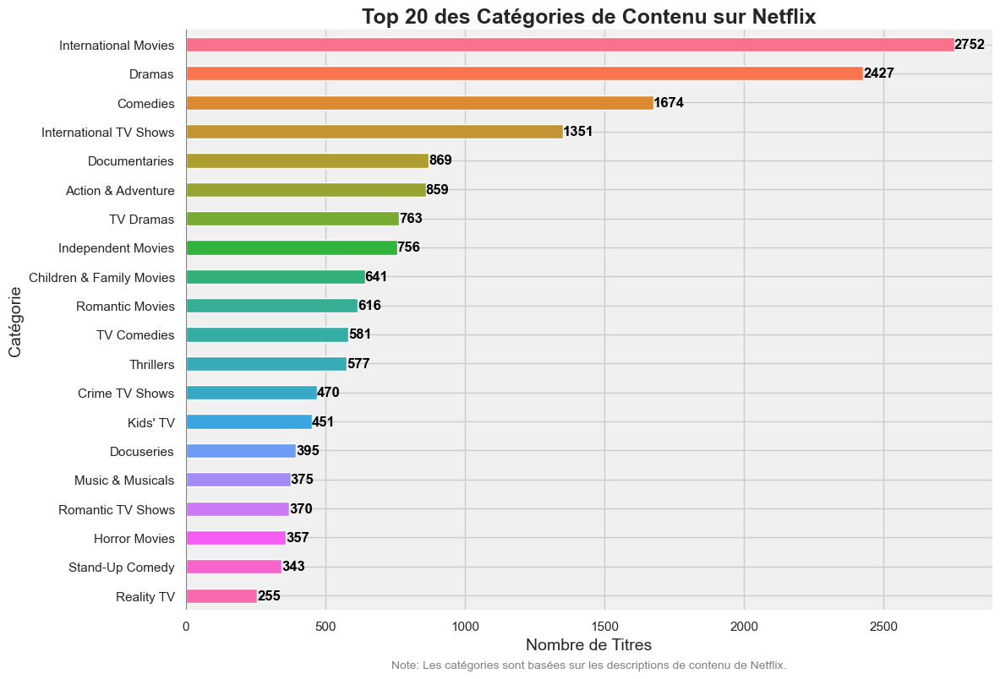

In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Supposons que votre DataFrame s'appelle DF

# Séparez les descriptions de la colonne 'listed_in' en différentes lignes
categories = DF['listed_in'].str.split(', ', expand=True).stack()

# Comptez le nombre d'occurrences de chaque description
category_counts = categories.value_counts()

# Sélectionnez les 20 principales descriptions
top_20_categories = category_counts.head(20)

# Personnalisez le style avec Seaborn
sns.set(style="whitegrid")

# Créez le graphique à barres horizontal avec des couleurs vives
plt.figure(figsize=(12, 8))
colors = sns.color_palette("husl", len(top_20_categories))
top_20_categories.plot(kind="barh", color=colors)
plt.title('Top 20 des Catégories de Contenu sur Netflix', fontsize=18, fontweight='bold')
plt.xlabel('Nombre de Titres', fontsize=14)
plt.ylabel('Catégorie', fontsize=14)

# Ajoutez des étiquettes aux barres avec une police plus grande et en gras
for index, value in enumerate(top_20_categories):
    plt.text(value, index, str(value), ha='left', va='center', fontsize=12, fontweight='bold', color='black')

# Inversez l'ordre pour afficher la catégorie la plus populaire en haut
plt.gca().invert_yaxis()

# Ajoutez un fond coloré pour un look distinctif
plt.gca().set_facecolor('#f0f0f0')

# Supprimez la bordure autour du graphique
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)

# Affichez le graphique avec un espace ajusté
plt.tight_layout()

# Affichez une ligne de séparation entre le graphique et le titre
plt.axvline(x=0, color='gray', linewidth=0.7)

# Ajoutez une note explicative en bas du graphique
plt.annotate('Note: Les catégories sont basées sur les descriptions de contenu de Netflix.',
             (0.5, -0.1),
             xycoords='axes fraction',
             fontsize=10,
             color='gray',
             ha='center')

# Affichez le graphique final
plt.show()



In [114]:
import geopandas as gpd
import folium
import pandas as pd

# Supposons que vous ayez déjà chargé votre DataFrame DF

# Charger la carte géographique du monde
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Correction pour les États-Unis
country_counts_df['country'] = country_counts_df['country'].replace({'United States': 'United States of America'})

# Créer la carte choroplèthe
m = folium.Map(location=[0, 0], zoom_start=2)

# Choropleth map with hue based on total counts (Movies + TV Shows)
folium.Choropleth(
    geo_data=world,
    data=country_counts_df,
    columns=['country', 'Total'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Titles',  # Titre de la légende
    highlight=True,
).add_to(m)

# Add the total count labels to the map for countries with data
for _, row in country_counts_df.iterrows():
    country_name = row['country']
    if not world[world['name'] == country_name].empty:
        label = folium.DivIcon(html=f"<div>{row['Total']}</div>", icon_size=(30, 30))
        folium.Marker(
            location=[world[world['name'] == country_name].geometry.centroid.y.values[0],
                      world[world['name'] == country_name].geometry.centroid.x.values[0]],
            icon=label,
        ).add_to(m)

# Ajouter un titre à la carte
title = folium.Html('<h2>Total de Films et d\'Émissions de Télévision par Pays</h2>')
title = folium.Popup(title, max_width=300)
title.add_to(m)

# Afficher la carte interactive
m



In [106]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


In [113]:
import geopandas as gpd
import folium
import pandas as pd

# Supposons que vous ayez déjà chargé votre DataFrame DF

# Charger la carte géographique du monde
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Correction pour les États-Unis
country_counts_df['country'] = country_counts_df['country'].replace({'United States': 'United States of America'})

# Créer la carte choroplèthe
m = folium.Map(location=[0, 0], zoom_start=2)

# Choropleth map with hue based on total counts (Movies + TV Shows)
folium.Choropleth(
    geo_data=world,
    data=country_counts_df,
    columns=['country', 'Total'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Titles',
    highlight=True,
).add_to(m)

# Add the total count labels to the map for countries with data
for _, row in country_counts_df.iterrows():
    country_name = row['country']
    if not world[world['name'] == country_name].empty:
        label = folium.DivIcon(html=f"<div>{row['Total']}</div>", icon_size=(30, 30))
        folium.Marker(
            location=[world[world['name'] == country_name].geometry.centroid.y.values[0],
                      world[world['name'] == country_name].geometry.centroid.x.values[0]],
            icon=label,
        ).add_to(m)

# Display the interactive map
m



In [153]:
# Styles conditionnels pour le DataFrame "DF" - Mise en forme des données

# Définissez les styles pour chaque colonne
styles = {'type': 'background-color: lightyellow',
          'director': 'background-color: lightyellow',
          'cast': 'background-color: lightyellow',
          'country': 'background-color: lightyellow',
          'release_year': 'background-color: lightblue',
          'rating': 'background-color: lightyellow',
          'duration': 'background-color: lightblue',
          'listed_in': 'background-color: lightyellow',
          'description': 'background-color: lightyellow'}

# Appliquez les styles au DataFrame DF
styled_DF = DF.style.apply(lambda x: [styles.get(col, '') for col in x.index], axis=1)

# Affichez le DataFrame stylisé
styled_DF
